<h1 style="font-size: 36pt;">G2M-insight-for-Cab-Investment-firm</h1>

In the G2M insight for Cab Investment firm ( Must for all Specialization) project, we will show which company is the better opportunity to invest in it.

Here is some points before checking the results out:

<h1 style="font-size: 36pt;">We use 4 datasets</h1>

Cab_Data.csv

City.csv

Customer_ID.csv

Transaction_ID.csv

You should fully investigate and understand each data set.

    Review the Source Documentation
    Understand the field names and data types
    Identify relationships across the files
    Field/feature transformations
    Determine which files should be joined versus which ones should be appended
    Create master data and explain the relationship
    Identify and remove duplicates
    Perform other analysis like NA value and outlier detection

Importing Libraries

In [7]:
import numpy as np
import warnings
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import datetime as dt

<h1 style="color: #333333;">Loading Dataset</h1>

In [9]:
df_cab = pd.read_csv('./datasets/Cab_Data.csv')
df_city = pd.read_csv('./datasets/City.csv')
df_cust = pd.read_csv('./datasets/Customer_ID.csv')
df_tran = pd.read_csv('./datasets/Transaction_ID.csv')
warnings.filterwarnings("ignore")

<h1 style="color: #333333;">Observing Each Data</h1>

In [10]:
df_cab.head(10)

,Transaction ID,Date of Travel,Company,City,KM Travelled,Price Charged,Cost of Trip
0,10000011,42377,Pink Cab,ATLANTA GA,30.45,370.95,313.635
1,10000012,42375,Pink Cab,ATLANTA GA,28.62,358.52,334.854
2,10000013,42371,Pink Cab,ATLANTA GA,9.04,125.20,97.632
3,10000014,42376,Pink Cab,ATLANTA GA,33.17,377.40,351.602
4,10000015,42372,Pink Cab,ATLANTA GA,8.73,114.62,97.776
5,10000016,42376,Pink Cab,ATLANTA GA,6.06,72.43,63.024
6,10000017,42372,Pink Cab,AUSTIN TX,44.00,576.15,475.200
7,10000018,42376,Pink Cab,AUSTIN TX,35.65,466.10,377.890
8,10000019,42381,Pink Cab,BOSTON MA,14.40,191.61,146.880
9,10000020,42375,Pink Cab,BOSTON MA,10.89,156.98,113.256


we need to change the type of Data of Travel Cols

In [11]:
from datetime import datetime

def handle_date(date):
    convert = datetime.fromordinal(datetime(1900, 1, 30).toordinal() + date - 2).strftime("%d-%m-%Y")
    return datetime.strptime(convert, "%d-%m-%Y")
df_cab['Date of Travel'] = df_cab['Date of Travel'].apply(lambda x: handle_date(x))

In [12]:
df_cab.head()

,Transaction ID,Date of Travel,Company,City,KM Travelled,Price Charged,Cost of Trip
0,10000011,2016-02-06,Pink Cab,ATLANTA GA,30.45,370.95,313.635
1,10000012,2016-02-04,Pink Cab,ATLANTA GA,28.62,358.52,334.854
2,10000013,2016-01-31,Pink Cab,ATLANTA GA,9.04,125.20,97.632
3,10000014,2016-02-05,Pink Cab,ATLANTA GA,33.17,377.40,351.602
4,10000015,2016-02-01,Pink Cab,ATLANTA GA,8.73,114.62,97.776


In [13]:
df_tran.head()

,Transaction ID,Customer ID,Payment_Mode
0,10000011,29290,Card
1,10000012,27703,Card
2,10000013,28712,Cash
3,10000014,28020,Cash
4,10000015,27182,Card


In [14]:
df_cust.head()

,Customer ID,Gender,Age,Income (USD/Month)
0,29290,Male,28,10813
1,27703,Male,27,9237
2,28712,Male,53,11242
3,28020,Male,23,23327
4,27182,Male,33,8536


In [15]:
df_city.head()

,City,Population,Users
0,NEW YORK NY,"8,405,837","302,149"
1,CHICAGO IL,"1,955,130","164,468"
2,LOS ANGELES CA,"1,595,037","144,132"
3,MIAMI FL,"1,339,155","17,675"
4,SILICON VALLEY,"1,177,609","27,247"


In [16]:

df_tran_cust = pd.merge(df_tran, df_cust, on='Customer ID')
df_tran_cust

,Transaction ID,Customer ID,Payment_Mode,Gender,Age,Income (USD/Month)
0,10000011,29290,Card,Male,28,10813
1,10351127,29290,Cash,Male,28,10813
2,10412921,29290,Card,Male,28,10813
3,10000012,27703,Card,Male,27,9237
4,10320494,27703,Card,Male,27,9237
...,...,...,...,...,...,...
440093,10439799,12490,Cash,Male,33,18713
440094,10439820,14971,Card,Male,30,15346
440095,10439838,41414,Card,Male,38,3960
440096,10439840,41677,Cash,Male,23,19454


In [17]:
# Check the shape of whole dataset
print("shape of df_cab", df_cab.shape)
print("shape of df_tran_cust", df_tran_cust.shape)
print("shape of df_city", df_city.shape)


shape of df_cab (359392, 7)
shape of df_tran_cust (440098, 6)
shape of df_city (20, 3)


In [18]:
df_cab_tran_cust = pd.merge(df_cab, df_tran_cust, on='Transaction ID')
df_cab_tran_cust

,Transaction ID,Date of Travel,Company,City,KM Travelled,Price Charged,Cost of Trip,Customer ID,Payment_Mode,Gender,Age,Income (USD/Month)
0,10000011,2016-02-06,Pink Cab,ATLANTA GA,30.45,370.95,313.6350,29290,Card,Male,28,10813
1,10000012,2016-02-04,Pink Cab,ATLANTA GA,28.62,358.52,334.8540,27703,Card,Male,27,9237
2,10000013,2016-01-31,Pink Cab,ATLANTA GA,9.04,125.20,97.6320,28712,Cash,Male,53,11242
3,10000014,2016-02-05,Pink Cab,ATLANTA GA,33.17,377.40,351.6020,28020,Cash,Male,23,23327
4,10000015,2016-02-01,Pink Cab,ATLANTA GA,8.73,114.62,97.7760,27182,Card,Male,33,8536
...,...,...,...,...,...,...,...,...,...,...,...,...
359387,10440101,2018-02-06,Yellow Cab,WASHINGTON DC,4.80,69.24,63.3600,52392,Cash,Male,24,15651
359388,10440104,2018-02-02,Yellow Cab,WASHINGTON DC,8.40,113.75,106.8480,53286,Cash,Male,32,6528
359389,10440105,2018-02-03,Yellow Cab,WASHINGTON DC,27.75,437.07,349.6500,52265,Cash,Male,56,7966
359390,10440106,2018-02-03,Yellow Cab,WASHINGTON DC,8.80,146.19,114.0480,52175,Card,Male,32,6423


In [19]:
All_Data= pd.merge(df_cab_tran_cust, df_city, on='City')
def convert_int(x):
    return int(x.replace(',', ''))
All_Data['Users'] = All_Data['Users'].apply(lambda x: convert_int(x))
All_Data

,Transaction ID,Date of Travel,Company,City,KM Travelled,Price Charged,Cost of Trip,Customer ID,Payment_Mode,Gender,Age,Income (USD/Month),Population,Users
0,10000011,2016-02-06,Pink Cab,ATLANTA GA,30.45,370.95,313.6350,29290,Card,Male,28,10813,"814,885",24701
1,10000012,2016-02-04,Pink Cab,ATLANTA GA,28.62,358.52,334.8540,27703,Card,Male,27,9237,"814,885",24701
2,10000013,2016-01-31,Pink Cab,ATLANTA GA,9.04,125.20,97.6320,28712,Cash,Male,53,11242,"814,885",24701
3,10000014,2016-02-05,Pink Cab,ATLANTA GA,33.17,377.40,351.6020,28020,Cash,Male,23,23327,"814,885",24701
4,10000015,2016-02-01,Pink Cab,ATLANTA GA,8.73,114.62,97.7760,27182,Card,Male,33,8536,"814,885",24701
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
359387,10440101,2018-02-06,Yellow Cab,WASHINGTON DC,4.80,69.24,63.3600,52392,Cash,Male,24,15651,"418,859",127001
359388,10440104,2018-02-02,Yellow Cab,WASHINGTON DC,8.40,113.75,106.8480,53286,Cash,Male,32,6528,"418,859",127001
359389,10440105,2018-02-03,Yellow Cab,WASHINGTON DC,27.75,437.07,349.6500,52265,Cash,Male,56,7966,"418,859",127001
359390,10440106,2018-02-03,Yellow Cab,WASHINGTON DC,8.80,146.19,114.0480,52175,Card,Male,32,6423,"418,859",127001


In [20]:
All_Data.iloc[:,[False,False,False,False,True,True,True,False,False,False,True,True,True,True]].describe()

,KM Travelled,Price Charged,Cost of Trip,Age,Income (USD/Month),Users
count,359392.000000,359392.000000,359392.000000,359392.000000,359392.000000,359392.000000
mean,22.567254,423.443311,286.190113,35.336705,15048.822937,158365.582267
std,12.233526,274.378911,157.993661,12.594234,7969.409482,100850.051020
min,1.900000,15.600000,19.000000,18.000000,2000.000000,3643.000000
25%,12.000000,206.437500,151.200000,25.000000,8424.000000,80021.000000
50%,22.440000,386.360000,282.480000,33.000000,14685.000000,144132.000000
75%,32.960000,583.660000,413.683200,42.000000,21035.000000,302149.000000
max,48.000000,2048.030000,691.200000,65.000000,35000.000000,302149.000000


In [21]:
All_Data['Profit'] = All_Data['Price Charged'] - All_Data['Cost of Trip']
All_Data['Year'] = All_Data['Date of Travel'].dt.year
All_Data['Month'] = All_Data['Date of Travel'].dt.month
All_Data['Day'] = All_Data['Date of Travel'].dt.day
All_Data.head()

,Transaction ID,Date of Travel,Company,City,KM Travelled,Price Charged,Cost of Trip,Customer ID,Payment_Mode,Gender,Age,Income (USD/Month),Population,Users,Profit,Year,Month,Day
0,10000011,2016-02-06,Pink Cab,ATLANTA GA,30.45,370.95,313.635,29290,Card,Male,28,10813,"814,885",24701,57.315,2016,2,6
1,10000012,2016-02-04,Pink Cab,ATLANTA GA,28.62,358.52,334.854,27703,Card,Male,27,9237,"814,885",24701,23.666,2016,2,4
2,10000013,2016-01-31,Pink Cab,ATLANTA GA,9.04,125.20,97.632,28712,Cash,Male,53,11242,"814,885",24701,27.568,2016,1,31
3,10000014,2016-02-05,Pink Cab,ATLANTA GA,33.17,377.40,351.602,28020,Cash,Male,23,23327,"814,885",24701,25.798,2016,2,5
4,10000015,2016-02-01,Pink Cab,ATLANTA GA,8.73,114.62,97.776,27182,Card,Male,33,8536,"814,885",24701,16.844,2016,2,1


In [22]:
# before doing EDA, let's split the dataset into Pink Cab and Yellow Cab
PinkCab = All_Data[All_Data['Company']=='Pink Cab']
YellowCab = All_Data[All_Data['Company']=='Yellow Cab']

<span style="color: blue; font-size: 24px;">Data Description For Blue And Yellow Cabs</span>

In [23]:
PinkCab.iloc[:,[False,False,False,False,True,True,True,False,False,False,True,True,True,True,True,False,False,False]].describe()

,KM Travelled,Price Charged,Cost of Trip,Age,Income (USD/Month),Users,Profit
count,84711.000000,84711.000000,84711.000000,84711.000000,84711.000000,84711.000000,84711.000000
mean,22.559917,310.800856,248.148682,35.322414,15059.047137,125590.813330,62.652174
std,12.231092,181.995661,135.403345,12.644780,7991.077762,94593.433659,77.590378
min,1.900000,15.600000,19.000000,18.000000,2000.000000,3643.000000,-220.060000
25%,12.000000,159.970000,131.868000,25.000000,8371.000000,27247.000000,11.206000
50%,22.440000,298.060000,246.330000,33.000000,14713.000000,144132.000000,41.500000
75%,32.960000,441.505000,360.180000,42.000000,21055.000000,164468.000000,93.965000
max,48.000000,1623.480000,576.000000,65.000000,35000.000000,302149.000000,1119.480000


In [24]:
YellowCab.iloc[:,[False,False,False,False,True,True,True,False,False,False,True,True,True,True,True,False,False,False]].describe()

,KM Travelled,Price Charged,Cost of Trip,Age,Income (USD/Month),Users,Profit
count,274681.000000,274681.000000,274681.000000,274681.000000,274681.000000,274681.000000,274681.000000
mean,22.569517,458.181990,297.922004,35.341112,15045.669817,168473.246981,160.259986
std,12.234298,288.386166,162.548986,12.578625,7962.727062,100570.558886,171.823833
min,1.900000,20.730000,22.800000,18.000000,2000.000000,3643.000000,-176.930800
25%,11.990000,226.680000,158.400000,25.000000,8439.000000,80021.000000,37.180000
50%,22.440000,425.060000,295.596000,33.000000,14676.000000,144132.000000,102.000000
75%,32.960000,633.880000,432.432000,42.000000,21023.000000,302149.000000,228.670400
max,48.000000,2048.030000,691.200000,65.000000,34996.000000,302149.000000,1463.966000


In [25]:
All_Data.to_csv('All_Data.csv')

<span style="color: #FF00FF; font-size: 36px;">Visualize the Whole Dataset</span>

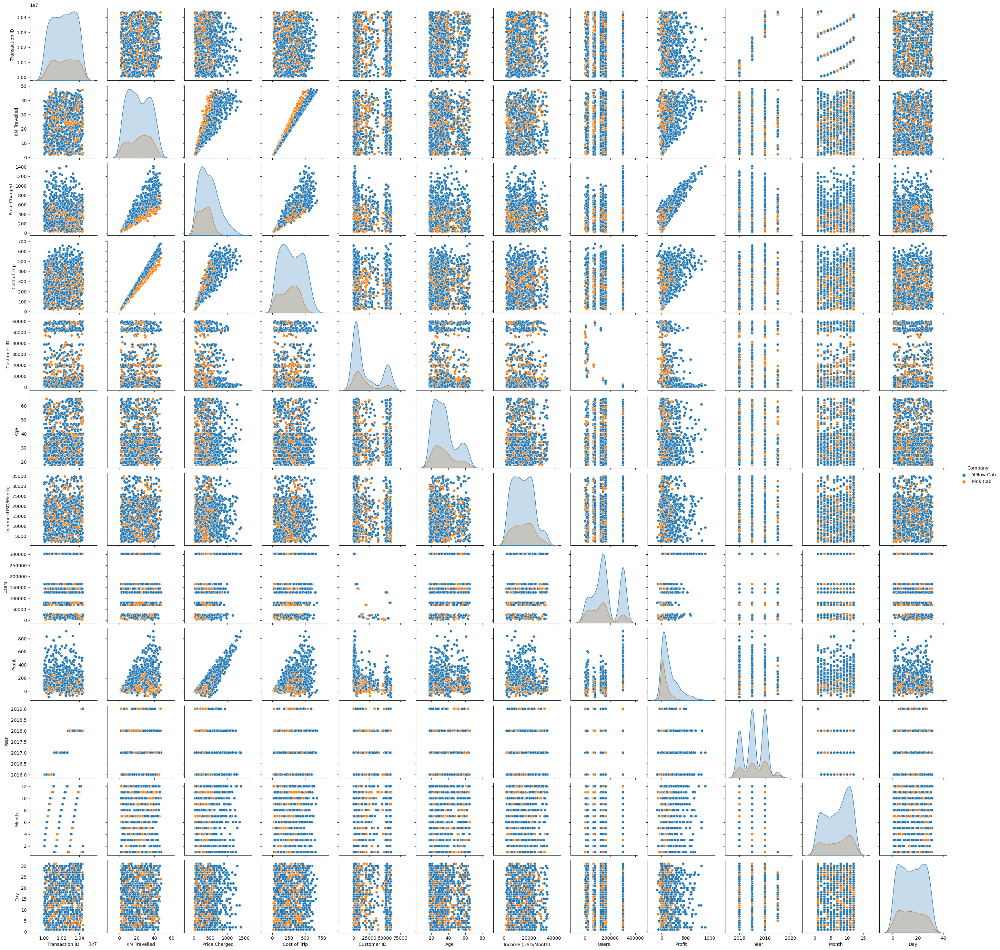

In [26]:
sns.pairplot(All_Data.sample(1000), hue = 'Company')

In [27]:
plt.show()

In [28]:
data_corr = All_Data.corr()
data_corr

,Transaction ID,KM Travelled,Price Charged,Cost of Trip,Customer ID,Age,Income (USD/Month),Users,Profit,Year,Month,Day
Transaction ID,1.000000,-0.001429,-0.052902,-0.003462,-0.016912,-0.001267,-0.001570,0.013526,-0.087130,0.941131,0.083122,0.003318
KM Travelled,-0.001429,1.000000,0.835753,0.981848,0.000389,-0.000369,-0.000544,-0.000428,0.462768,-0.000971,-0.001784,0.001078
Price Charged,-0.052902,0.835753,1.000000,0.859812,-0.177324,-0.003084,0.003228,0.281061,0.864154,-0.035713,-0.050797,-0.006026
Cost of Trip,-0.003462,0.981848,0.859812,1.000000,0.003077,-0.000189,-0.000633,0.023628,0.486056,-0.001964,-0.006753,0.001099
Customer ID,-0.016912,0.000389,-0.177324,0.003077,1.000000,-0.004735,-0.013608,-0.610742,-0.306527,-0.011778,-0.015150,0.002241
Age,-0.001267,-0.000369,-0.003084,-0.000189,-0.004735,1.000000,0.003907,-0.005906,-0.005093,-0.001273,0.000061,-0.002302
Income (USD/Month),-0.001570,-0.000544,0.003228,-0.000633,-0.013608,0.003907,1.000000,0.010464,0.006148,-0.002062,0.001928,0.000844
Users,0.013526,-0.000428,0.281061,0.023628,-0.610742,-0.005906,0.010464,1.000000,0.457758,0.009846,0.004723,-0.002833
Profit,-0.087130,0.462768,0.864154,0.486056,-0.306527,-0.005093,0.006148,0.457758,1.000000,-0.059188,-0.080286,-0.011398
Year,0.941131,-0.000971,-0.035713,-0.001964,-0.011778,-0.001273,-0.002062,0.009846,-0.059188,1.000000,-0.240554,-0.032196


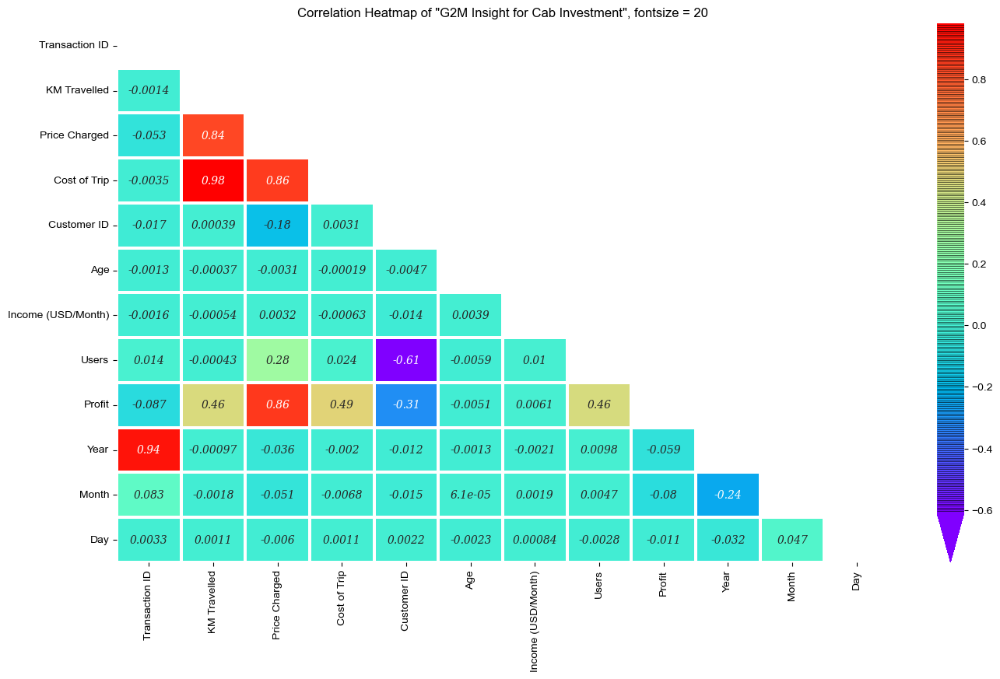

In [29]:
# Define the figure size
plt.figure(figsize = (16, 9))

# Cutomize the annot
annot_kws={'fontsize':10,                      # To change the size of the font
           'fontstyle':'italic',               # To change the style of font 
           'fontfamily': 'serif',              # To change the family of font 
           'alpha':1 }                         # To change the transparency of the text  


# Customize the cbar
cbar_kws = {"shrink":1,                        # To change the size of the color bar
            'extend':'min',                    # To change the end of the color bar like pointed
            'extendfrac':0.1,                  # To adjust the extension of the color bar
            "drawedges":True,                  # To draw lines (edges) on the color bar
           }

# take upper correlation matrix
matrix = np.triu(data_corr)

# Generate heatmap correlation
ax = sns.heatmap(data_corr, mask = matrix, cmap = 'rainbow', annot = True, linewidth = 1.5 ,annot_kws= annot_kws, cbar_kws=cbar_kws)

# Set the title etc
plt.title('Correlation Heatmap of "G2M Insight for Cab Investment", fontsize = 20')

# Set the size of text
sns.set(font_scale = 1.2)
plt.show()

As we can see there is strong Correlation between

◉ Population vs Users 
◉ Price Charged vs Cost of Trip vs KM Travelled

<span style="color: #333333; font-size: 36px;">Investigating Data</span>

**Monthly Transaction Analysis**

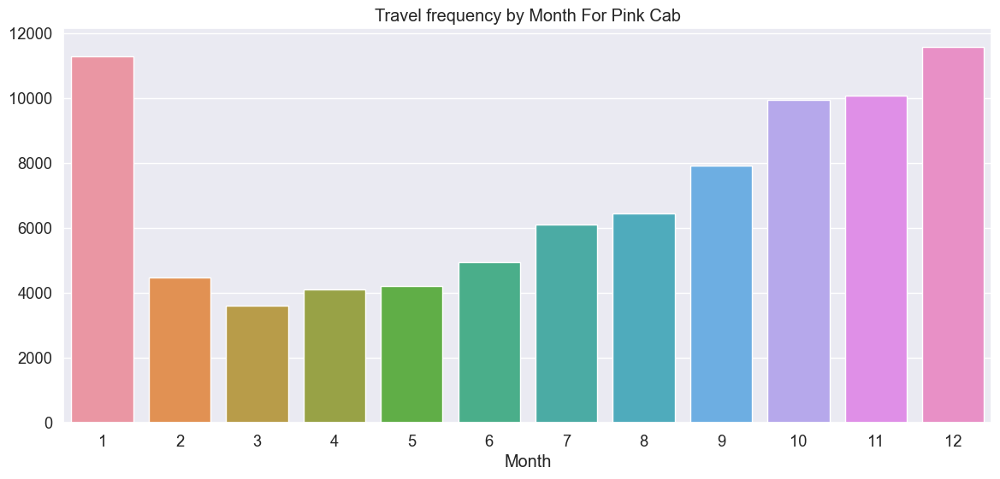

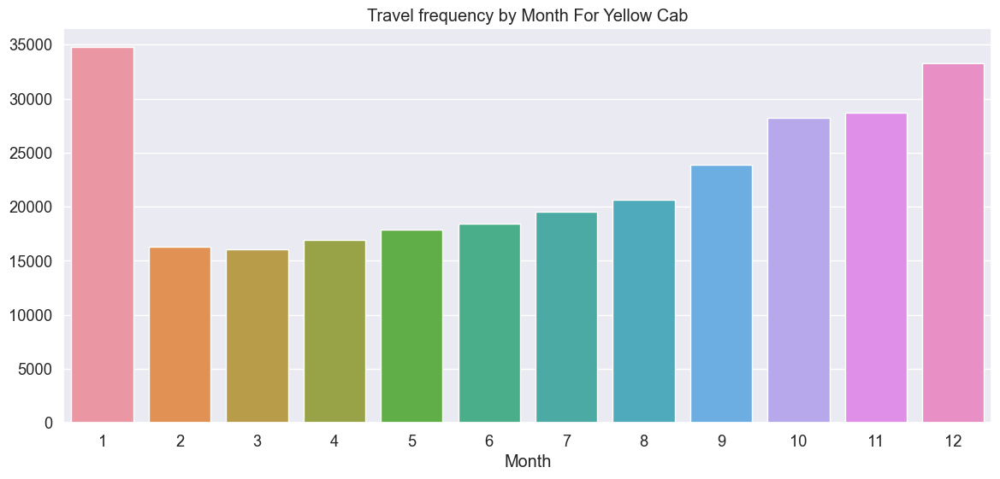

In [30]:
#data grouped bt Transaction ID
mtr=PinkCab.groupby(['Month'])['Transaction ID'].count()
plt.figure(figsize=(14,6))
sns.barplot(x=mtr.index,y=mtr.values)
plt.title('Travel frequency by Month For Pink Cab')
plt.show()
#data grouped bt Transaction ID
mtr=YellowCab.groupby(['Month'])['Transaction ID'].count()
plt.figure(figsize=(14,6))
sns.barplot(x=mtr.index,y=mtr.values)
plt.title('Travel frequency by Month For Yellow Cab')
plt.show()

**Yearly Transaction Analysis**

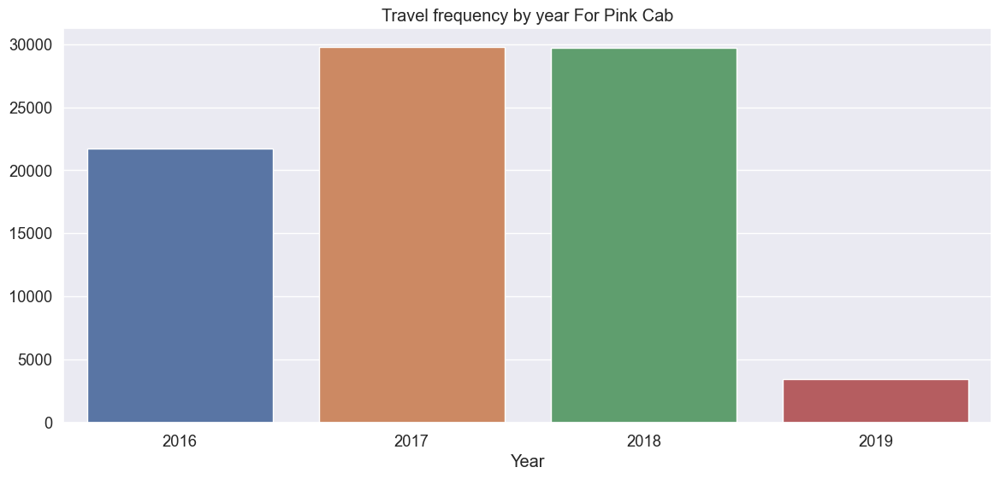

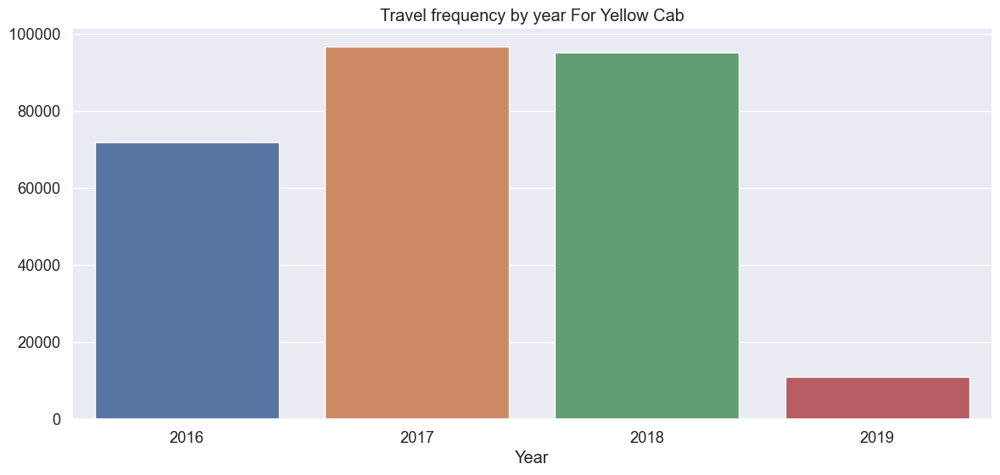

In [31]:
#Analysis-Yearly Transaction 
ytr=PinkCab.groupby(['Year'])['Transaction ID'].count()
plt.figure(figsize=(14,6))
sns.barplot(x=ytr.index,y=ytr.values)
plt.title('Travel frequency by year For Pink Cab')
plt.show()
#Analysis-Yearly Transaction 
ytr=YellowCab.groupby(['Year'])['Transaction ID'].count()
plt.figure(figsize=(14,6))
sns.barplot(x=ytr.index,y=ytr.values)
plt.title('Travel frequency by year For Yellow Cab')
plt.show()

**From the graph it shows that on yearly basis no. of transactions for Yellow cab is higher than Pink cab.**

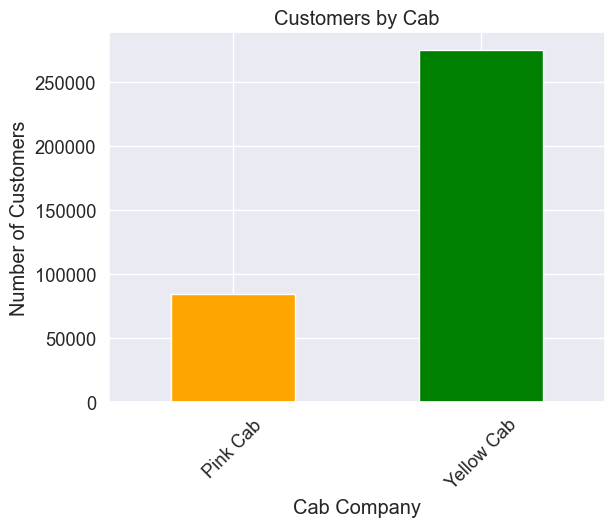

In [32]:
All_Data['Company'].value_counts(ascending=True).plot(kind='bar', color=['orange', 'green'], rot=45)
plt.xlabel('Cab Company')
plt.ylabel('Number of Customers')
plt.title('Customers by Cab')
plt.show()

**We can clearky see Yellow Cab has lot more customers.**

<span style="color:blue; font-weight:bold; font-size:24px">Price Charged</span>

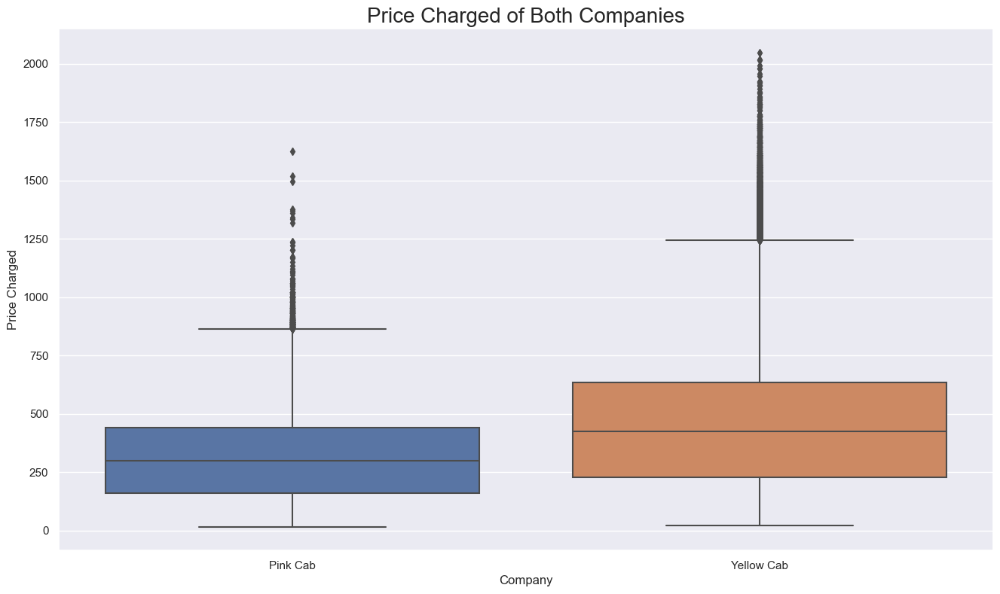

In [33]:
sns.set(style = 'darkgrid')

plt.figure(figsize = (16, 9))

sns.boxplot(All_Data['Company'], All_Data['Price Charged'])
plt.title('Price Charged of Both Companies', fontsize=20)
plt.show()

**As we can see Price Charged of Yellow Cab is highest as compared to Pink Cab**

<span style="color:blue; font-weight:bold; font-size:24px">Profit Margin For Both Companies</span>

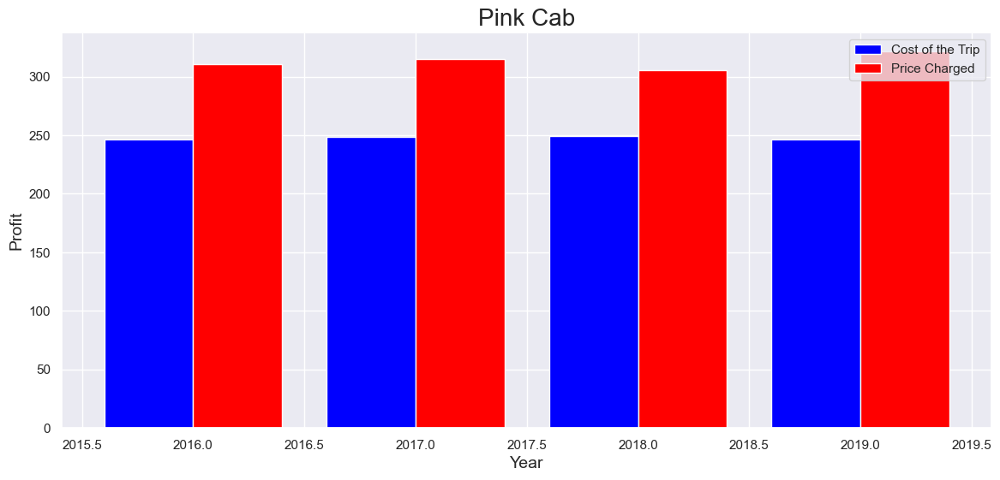

In [34]:

PinkCab.groupby('Year')["Price Charged"].mean()
PinkCab.groupby('Year')["Cost of Trip"].mean()

plot1 = PinkCab.groupby('Year')["Transaction ID"].count()
plot3 = PinkCab.groupby('Year')["Price Charged"].mean()
plot4 = PinkCab.groupby('Year')["Cost of Trip"].mean()
plt.figure(figsize=(14,6))
ax = plt.subplot(111)
ax.bar(plot1.index-0.2, plot4.values, width=0.4, color='blue', align='center',label='Cost of the Trip')
ax.bar(plot1.index+0.2, plot3.values, width=0.4, color='red', align='center',label='Price Charged')
plt.ylabel('Profit',fontsize=14)
plt.xlabel('Year',fontsize=14)
plt.title('Pink Cab', fontsize=20)
plt.legend()
plt.show()

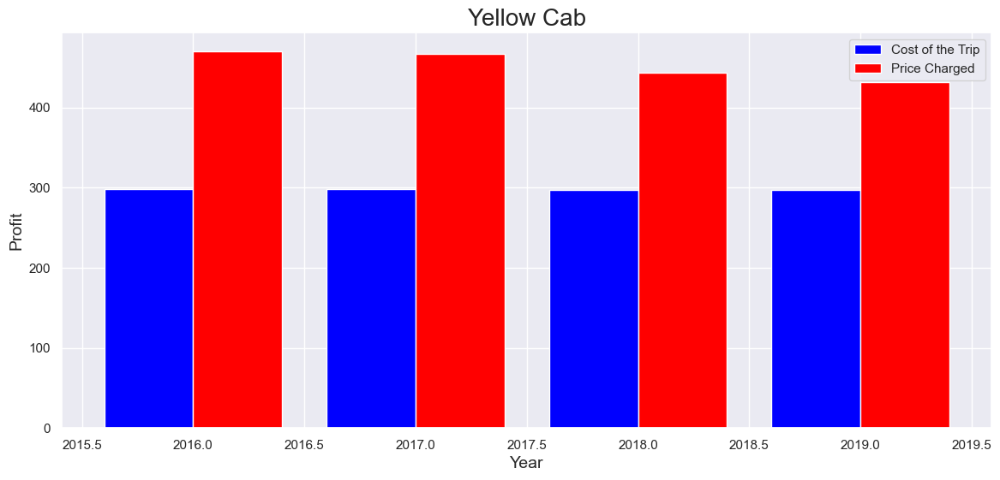

In [35]:

YellowCab.groupby('Year')["Price Charged"].mean()
YellowCab.groupby('Year')["Cost of Trip"].mean()

plot1 = YellowCab.groupby('Year')["Transaction ID"].count()
plot3 = YellowCab.groupby('Year')["Price Charged"].mean()
plot4 = YellowCab.groupby('Year')["Cost of Trip"].mean()
plt.figure(figsize=(14,6))
ax = plt.subplot(111)
ax.bar(plot1.index-0.2, plot4.values, width=0.4, color='blue', align='center',label='Cost of the Trip')
ax.bar(plot1.index+0.2, plot3.values, width=0.4, color='red', align='center',label='Price Charged')
plt.ylabel('Profit',fontsize=14)
plt.xlabel('Year',fontsize=14)
plt.title("Yellow Cab", fontsize=20)
plt.legend()
plt.show()

**The Yellow cab has a higher Profit Margin (Price Charged - Cost of Trip) compared to Pink cab**

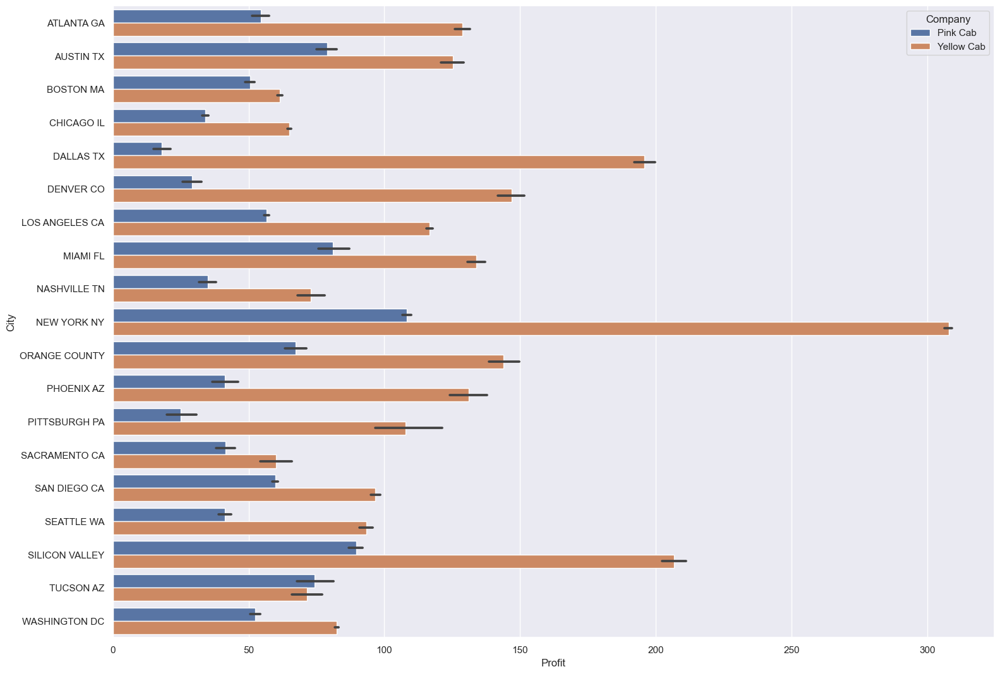

In [36]:
sns.set(rc={'figure.figsize':(18, 13)})
ax = sns.barplot(x='Profit', y="City", data=All_Data,hue='Company')
plt.show()

<span style="color:blue; font-weight:bold; font-size:24px">Another Way To Show User Travel</span>

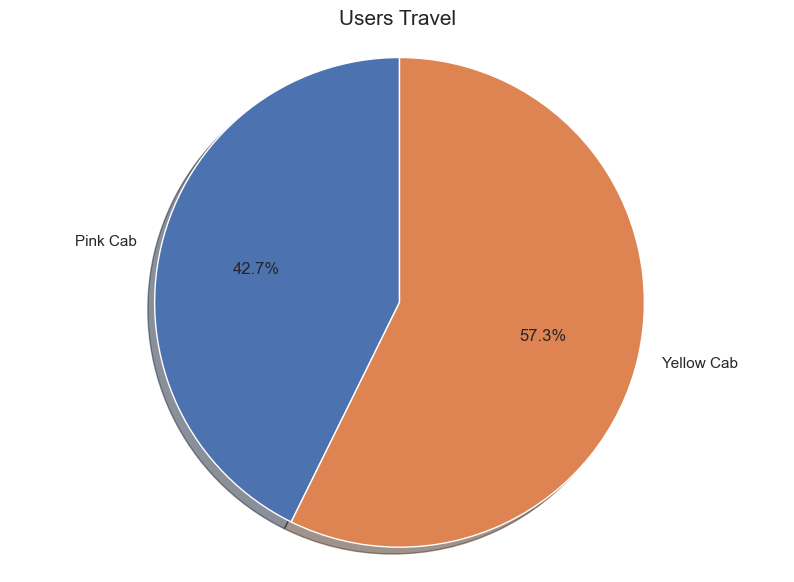

In [37]:
user=All_Data.groupby('Company')

avg_user = user.Users.mean()

index = avg_user.index
value = avg_user.values 
figp, axp = plt.subplots(figsize=(10,7))
axp.pie(value , labels=index, autopct='%1.1f%%',shadow=True, startangle=90,)
axp.axis('equal')

plt.title('Users Travel', fontsize = 15)
plt.show()

<span style="color:blue; font-weight:bold; font-size:24px">KM Travelled For Both Companies</span>

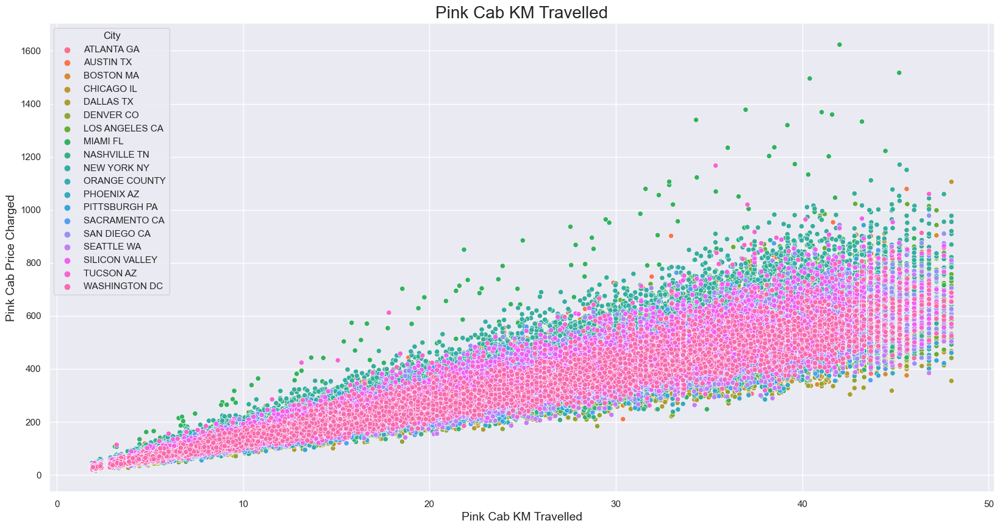

In [38]:
plt.figure(figsize=(20,10))
sns.scatterplot(data=All_Data, x=PinkCab["KM Travelled"], y=PinkCab['Price Charged'], hue="City")
plt.title('Pink Cab KM Travelled',fontsize = 20)
plt.ylabel('Pink Cab Price Charged',fontsize = 14)
plt.xlabel('Pink Cab KM Travelled',fontsize = 14)
plt.show()

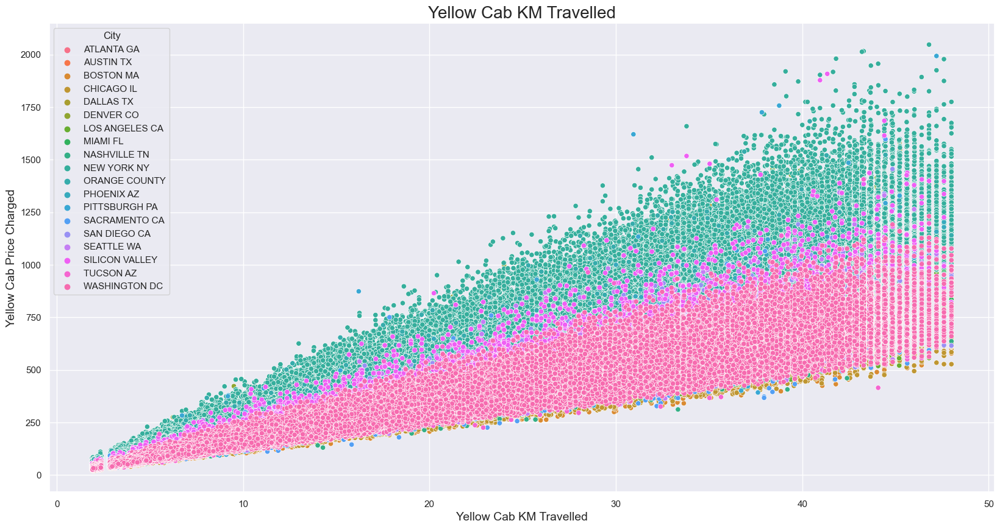

In [39]:
plt.figure(figsize=(20,10))
sns.scatterplot(data=All_Data, x=YellowCab["KM Travelled"], y=YellowCab['Price Charged'], hue="City")
plt.title('Yellow Cab KM Travelled',fontsize = 20)
plt.ylabel('Yellow Cab Price Charged',fontsize = 14)
plt.xlabel('Yellow Cab KM Travelled',fontsize = 14)
plt.show()


<ul style="list-style-type: none; padding-left: 0;">
<li><span style="font-weight: bold;">>From the graphs we see that for New York City the Yellow Cab price charged is more in comparison to the other cities.</span></li>
<li><span style="font-weight: bold;">and for Pink cab all the cities have the same increase in prices with increase in distance</span></li>
<li><span style="font-weight: bold;">the outliers exist in both the graphs which may be due to high end cars or weather.</span></li>
</ul



<span style="color:blue; font-weight:bold; font-size:24px">Users Per City</span>

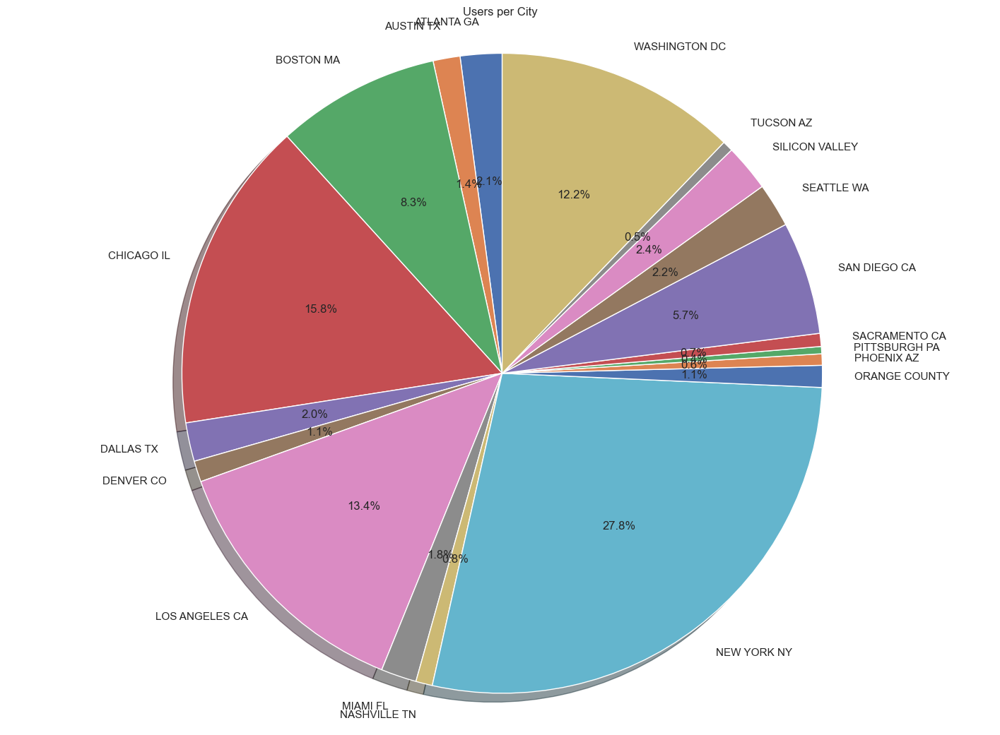

In [40]:
city_users = All_Data.groupby('City').Users.count()
labs = city_users.index
vals = city_users.values
figp, axp = plt.subplots(figsize=(18,13))
axp.pie(vals , labels=labs, autopct='%1.1f%%',shadow=True, startangle=90,)
axp.axis('equal')
plt.title('Users per City')
plt.show()

**New York City has the highest Cab users with 28% followed by Chicago with 16% and Los Angeles with 13%**

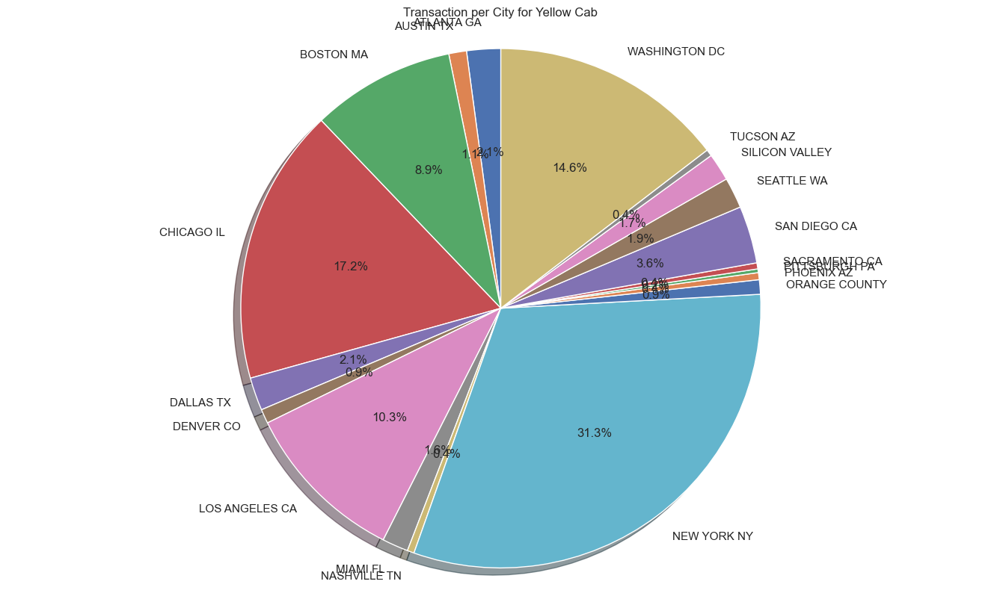

In [41]:
city_y = YellowCab.groupby('City')["Transaction ID"].count()
labs = city_y.index
vals = city_y.values
figp, axp = plt.subplots(figsize=(17,10))
axp.pie(vals , labels=labs, autopct='%1.1f%%',shadow=True, startangle=90,)
axp.axis('equal')

plt.title('Transaction per City for Yellow Cab')
plt.show()

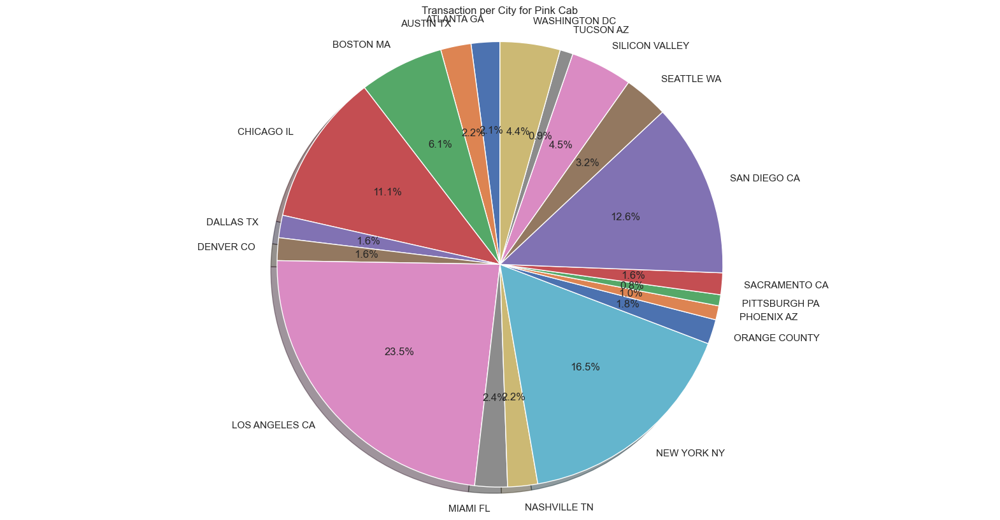

In [42]:
city_p = PinkCab.groupby('City')["Transaction ID"].count()

labs = city_p.index
vals = city_p.values
figp, axp = plt.subplots(figsize=(20,10))
axp.pie(vals , labels=labs, autopct='%1.1f%%',shadow=True, startangle=90,)
axp.axis('equal')

plt.title('Transaction per City for Pink Cab')
plt.show()

**Transaction for Yellow Cab is highest in New York City which has the highest Cab Users of 28%**

**Transaction for Pink Cab is highest in Los Angeles City**

<span style="color:blue; font-weight:bold; font-size:24px">Gender Data</span>

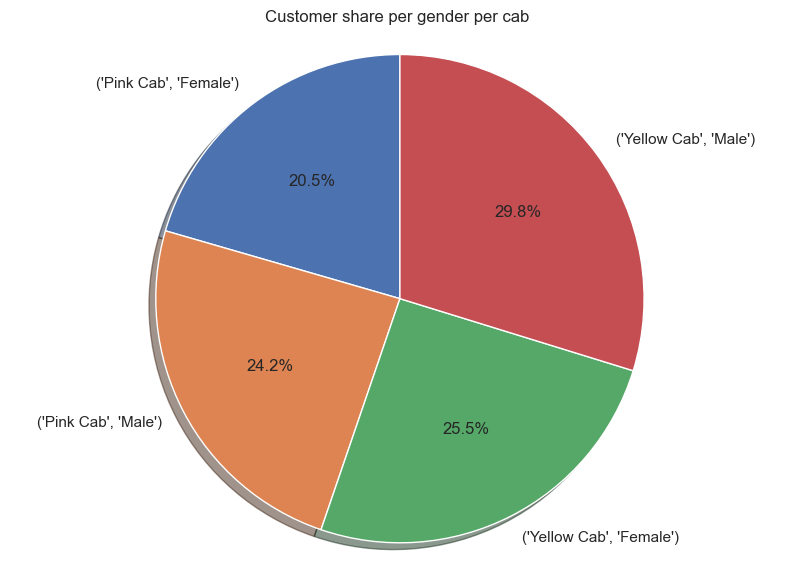

In [43]:
gender_cab=All_Data.groupby(['Company','Gender'])["Customer ID"].nunique()
labs = gender_cab.index
vals = gender_cab.values
figp, axp = plt.subplots(figsize=(10,7))
axp.pie(vals , labels=labs, autopct='%1.1f%%',shadow=True, startangle=90,)
axp.axis('equal')

plt.title('Customer share per gender per cab')
plt.show()

***Female Customers in Yellow Cab is higher compared to Male customers**

<span style="color:blue; font-weight:bold; font-size:24px">Profit And Time</span>

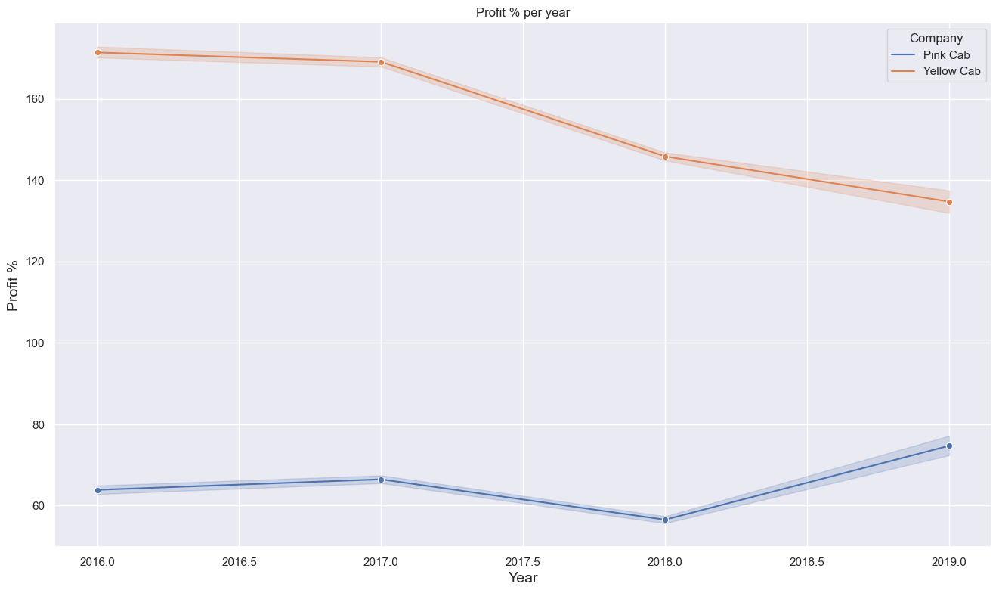

In [44]:
plt.figure(figsize = (16, 9))
sns.lineplot(x='Year', y='Profit', hue="Company", data=All_Data, marker='o')
plt.xlabel("Year", size=14)
plt.ylabel("Profit %", size=14)
plt.title("Profit % per year")
plt.show()

**While Profit Margin of Yellow Cab Deacreases Over Time Pink Cab Actually Increased**

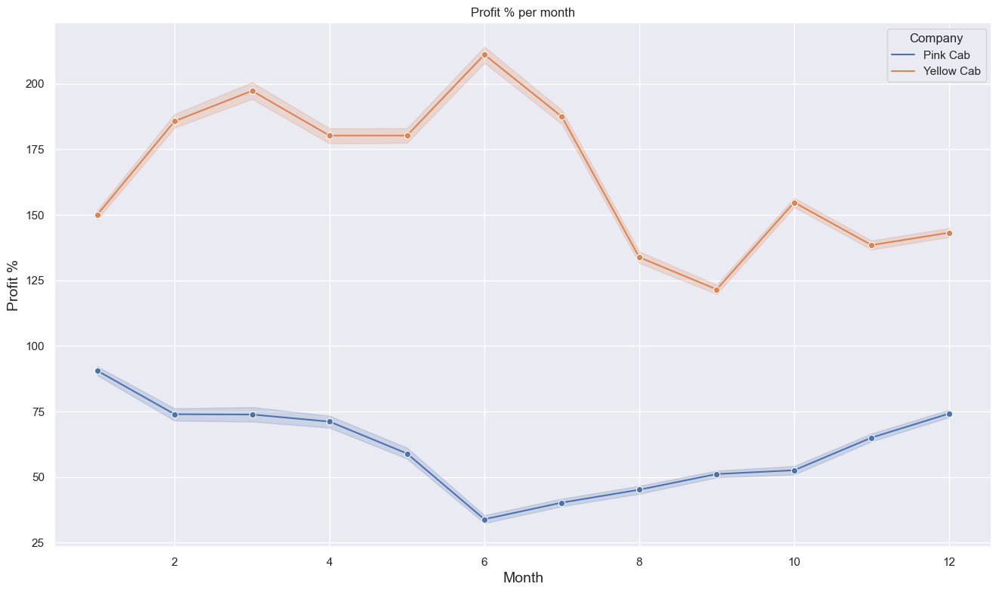

In [45]:
plt.figure(figsize = (16, 9))
sns.lineplot(x='Month', y='Profit', hue="Company", data=All_Data, marker='o')
plt.xlabel("Month", size=14)
plt.ylabel("Profit %", size=14)
plt.title("Profit % per month")
plt.show()

**For both companies profit margin varies between months but important to note here that they don't show the same increments or decrements**

<span style="color:blue; font-weight:bold; font-size:24px">Avarage Age of Users</span>

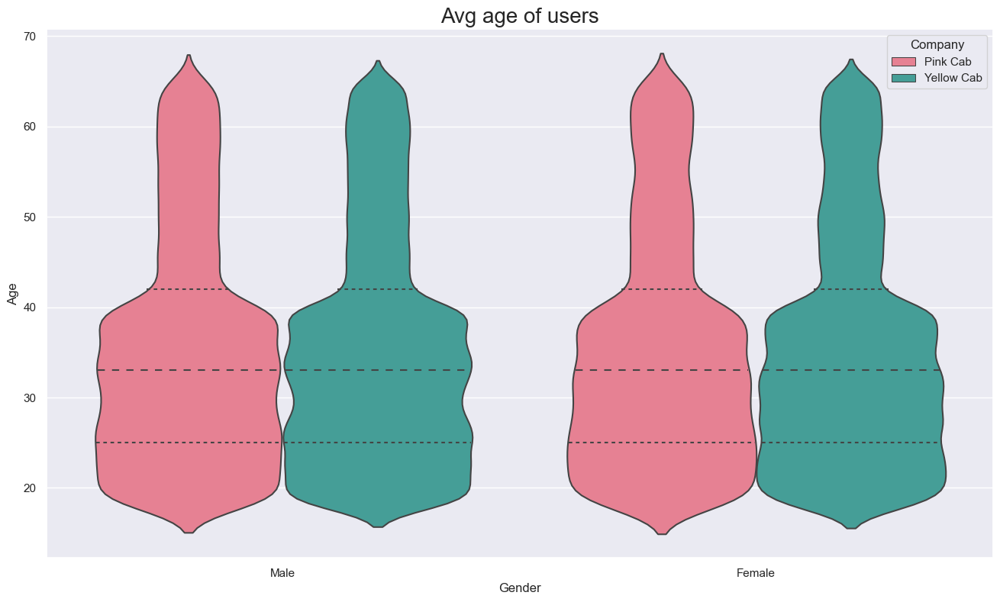

In [46]:
sns.set(style = 'darkgrid') 

plt.figure(figsize = (16, 9))

sns.violinplot(All_Data['Gender'], All_Data['Age'], hue = All_Data['Company'], palette = 'husl', inner = 'quartiles')
plt.title('Avg age of users', fontsize=20)
plt.show()

**As we can see 34 is Avarage age of Female and Male who use Cab service**

<span style="color:blue; font-weight:bold; font-size:24px">Hypotesis Testing</span>

<span style="color:red; font-weight:bold; font-size:16px">Hypothesis 1: Is there any difference in profit regarding Gender</span>

**H0** : There is no difference regarding Gender in both cab companies.
**H1** : There is difference regarding Gender in both cab companies.

<span style="color:blue; font-weight:bold; font-size:16px">Pink Cab</span>

In [47]:
a = PinkCab[(PinkCab.Gender=='Male')].groupby('Transaction ID').Profit.mean()
b = PinkCab[(PinkCab.Gender=='Female')].groupby('Transaction ID').Profit.mean()
print(a.shape[0],b.shape[0])
from scipy import stats
_, p_value = stats.ttest_ind(a.values,
                             b.values,
                             equal_var=True)

print('P value is ', p_value)

if(p_value<0.05):
    print('We accept alternative hypothesis (H1) that there is a difference regarding gender for Pink Cab.')
else:
    print('We accept null hypothesis (H0) that there is no difference regarding gender for Pink Cab or it is to low to matter.')

47231 37480
P value is  0.11515305900425798
We accept null hypothesis (H0) that there is no difference regarding gender for Pink Cab or it is to low to matter.


**We accept null hypothesis (H0) that there is no difference regarding gender for Pink Cab or it is to low to matter.**

<span style="color:blue; font-weight:bold; font-size:24px">Yellow Cab</span>

In [48]:
a = YellowCab[(YellowCab.Gender=='Male')].groupby('Transaction ID').Profit.mean()
b = YellowCab[(YellowCab.Gender=='Female')].groupby('Transaction ID').Profit.mean()
print(a.shape[0],b.shape[0])
from scipy import stats
_, p_value = stats.ttest_ind(a.values,
                             b.values,
                             equal_var=True)

print('P value is ', p_value)

if(p_value<0.05):
    print('We accept alternative hypothesis (H1) that there is a difference regarding gender for Pink Cab.')
else:
    print('We accept null hypothesis (H0) that there is no difference regarding gender for Pink Cab or it is to low to matter.')

158681 116000
P value is  6.060473042494056e-25
We accept alternative hypothesis (H1) that there is a difference regarding gender for Pink Cab.


**We accept alternative hypothesis (H1) that there is a difference regarding gender for Pink Cab.**

<span style="color:red; font-weight:bold; font-size:16px">Hypothesis 2: Is there difference in margins for Card payer and Cash payers</span>

In [49]:
#PinkCab
a = PinkCab[PinkCab.Payment_Mode=='Cash'].groupby('Transaction ID').Profit.mean()
b = PinkCab[PinkCab.Payment_Mode=='Card'].groupby('Transaction ID').Profit.mean()


_, p_value = stats.ttest_ind(a.values,b=b.values,equal_var=True)
if(p_value<0.05):
    print('We accept alternate hypothesis that theres a difference')
else:
    print('We accept null hypothesis that theres no difference')
    
print('P value is ', p_value)

We accept null hypothesis that theres no difference
P value is  0.7900465828793286


In [50]:
#YellowCab
a = YellowCab[YellowCab.Payment_Mode=='Cash'].groupby('Transaction ID').Profit.mean()
b = YellowCab[YellowCab.Payment_Mode=='Card'].groupby('Transaction ID').Profit.mean()


_, p_value = stats.ttest_ind(a.values,b=b.values,equal_var=True)
if(p_value<0.05):
    print('We accept alternate hypothesis that theres a difference')
else:
    print('We accept null hypothesis that theres no difference')
    
print('P value is ', p_value)

We accept null hypothesis that theres no difference
P value is  0.2933060638298729


<span style="color:red; font-weight:bold; font-size:16px">Hypothesis 3: Is there any difference in Profit regarding Age</span>

<span style="color:blue; font-weight:bold; font-size:24px">Yellow Cab</span>

In [51]:
a = YellowCab[YellowCab.Age <= 60].groupby('Transaction ID').Profit.mean()
b = YellowCab[YellowCab.Age >= 60].groupby('Transaction ID').Profit.mean()
print(a.shape[0],b.shape[0])

_, p_value = stats.ttest_ind(a.values,
                             b.values,
                             equal_var=True)

print('P value is ', p_value)

if(p_value<0.05):
    print('We accept alternative hypothesis (H1) that there is a difference regarding age for YellowCab Cab')
else:
    print('We accept null hypothesis (H0) that there is no difference regarding age for YellowCab Cab')

260356 17257
P value is  6.328485471267631e-05
We accept alternative hypothesis (H1) that there is a difference regarding age for YellowCab Cab


<span style="color:blue; font-weight:bold; font-size:24px">Pink Cab</span>

In [52]:
a = PinkCab[PinkCab.Age <= 60].groupby('Transaction ID').Profit.mean()
b = PinkCab[PinkCab.Age >= 60].groupby('Transaction ID').Profit.mean()
print(a.shape[0],b.shape[0])

_, p_value = stats.ttest_ind(a.values,
                             b.values,
                             equal_var=True)

print('P value is ', p_value)

if(p_value<0.05):
    print('We accept alternative hypothesis (H1) that there is a difference regarding age for Pink Cab')
else:
    print('We accept null hypothesis (H0) that there is no difference regarding age for Pink Cab')

80125 5429
P value is  0.4816748536155635
We accept null hypothesis (H0) that there is no difference regarding age for Pink Cab


<span style="color:red; font-weight:bold; font-size:16px">Hypothesis 4: Is there any difference in Profit regarding Payment mode</span>

<span style="color:blue; font-weight:bold; font-size:24px">Pink Cab</span>

In [53]:
a = PinkCab[PinkCab['Payment_Mode']=='Cash'].groupby('Transaction ID').Profit.mean()
b = PinkCab[PinkCab['Payment_Mode']=='Card'].groupby('Transaction ID').Profit.mean()

_, p_value = stats.ttest_ind(a.values,
                             b.values,
                             equal_var=True)

print('P value is ', p_value)

if(p_value<0.05):
    print('We accept alternative hypothesis (H1) that there is a difference in payment mode for Pink Cab')
else:
    print('We accept null hypothesis (H0) that there is no difference in payment mode for Pink Cab')

P value is  0.7900465828793286
We accept null hypothesis (H0) that there is no difference in payment mode for Pink Cab


<span style="color:blue; font-weight:bold; font-size:24px">Yellow Cab</span>

In [54]:
a = YellowCab[YellowCab['Payment_Mode']=='Cash'].groupby('Transaction ID').Profit.mean()
b = YellowCab[YellowCab['Payment_Mode']=='Card'].groupby('Transaction ID').Profit.mean()

_, p_value = stats.ttest_ind(a.values,
                             b.values,
                             equal_var=True)

print('P value is ', p_value)

if(p_value<0.05):
    print('We accept alternative hypothesis (H1) that there is a difference in payment mode for YellowCab Cab')
else:
    print('We accept null hypothesis (H0) that there is no difference in payment mode for YellowCab Cab')

P value is  0.2933060638298729
We accept null hypothesis (H0) that there is no difference in payment mode for YellowCab Cab


<span style="color:red; font-weight:bold; font-size:16px">Hypothesis 5: Is the average cost of a trip with Pink Cab is lower than that of Yellow Cab.</span>

In [55]:
a = YellowCab.groupby('Transaction ID')['Cost of Trip'].mean()
b = PinkCab.groupby('Transaction ID')['Cost of Trip'].mean()
print(a.shape[0], b.shape[0])

from scipy import stats
_, p_value = stats.ttest_ind(a.values,
                             b.values,
                             equal_var=True)

print('P value is ', p_value)

if p_value < 0.05:
    print('We accept alternative hypothesis (H1) that the average cost of a trip with Pink Cab is lower than that of Yellow Cab.')
else:
    print('We accept null hypothesis (H0) that there is no significant difference in the average cost of a trip between Pink Cab and Yellow Cab.')

274681 84711
P value is  0.0
We accept alternative hypothesis (H1) that the average cost of a trip with Pink Cab is lower than that of Yellow Cab.


<span style="color:red; font-weight:bold; font-size:16px">Hypotesis 6: The number of rides taken by customers in a particular city is correlated with the population of that city.</span>

In [70]:
from scipy.stats import pearsonr
All_Data['Population'] = All_Data['Population'].apply(lambda x: str(x))

All_Data['Population'] = All_Data['Population'].apply(lambda x: convert_int(x))
# Calculate the correlation between the number of rides and the population
pop_counts = All_Data.groupby('Population').size()
pop_counts = pop_counts.sort_index()
corr, p_value = pearsonr(pop_counts.index, pop_counts.values)

# create a bar chart of the population counts

# Print the results
if p_value < 0.05:
    print(f'We accept the alternative hypothesis (H1) that the number of rides is correlated with the population.\np value: {p_value}')
else:
    print('We accept the null hypothesis (H0) that there is no correlation between the number of rides and the population.')


We accept the alternative hypothesis (H1) that the number of rides is correlated with the population.
p value: 3.6168115765213676e-05


**CONCLUSION**

Based on the results of our analysis, it is clear that Pink Cab is still in the process of establishing itself in the market, as evidenced by its smaller market share in comparison to Yellow Cab. This is further supported by the fact that Pink Cab has a lower price per KM, likely in an effort to incentivize market disruption and attract customers away from more established competitors.

It is also worth noting that while Yellow Cab has been experiencing a decrease in profits over the years, Pink Cab's profits have been increasing. This trend suggests that Pink Cab has the potential for growth, which is a key consideration for investors seeking to maximize returns.

Despite Pink Cab's perceived disadvantages in terms of its market share and features, we recommend this company as the better investment opportunity. This recommendation takes into account the potential for growth and the fact that the company is still in transition, which presents an opportunity for investors to get in on the ground floor and potentially reap greater returns in the long run.